In [3]:
using Plots, Random, Distributions, StatsBase, Printf, LaTeXStrings, 
    DataFrames, StatsPlots, KernelDensity, LinearAlgebra
default(fillcolor=:lightgrey, markercolor=:black, markersize=2,
    grid=false, legend=false, titlefontsize=10)

# Metropolis-Hastings Algorithm

Metropolis-Hastings is another example of an MCMC method for obtainintg a sequence of random samples from a probability distribution $f$. Specifically, at each iteration, the algorithm picks a candidate for the next sample value based on the current sample value. Then, with some probability, the candidate is either accepted or rejected—the probability of acceptance is determined by comparing the values of the function $f$ at the current and at the candidate sample values with respect to the desired distribution.

## Metropolis-Hastings Random Walk

Starting with $\mathbf{X_{(0)}} := (X_1^{(0)}, \ldots, X_p^{(0)})$ and using a symmetric distribution $g$, iterate for $t=1, 2, \ldots$:
1. Draw $\epsilon \sim g$ and set $\mathbf{X} = \mathbf{X}^{(t-1)} + \epsilon$
2. Compute
$$\alpha(\mathbf{X}|\mathbf{X}^{(t-1)}) = \min\left\{1, \frac{f(\mathbf{X})}{f(\mathbf{X}^{t-1)})}\right\}$$
3. With probability $\alpha(\mathbf{X}|\mathbf{X}^{(t-1)})$ set $\mathbf{X}^{(t)} = \mathbf{X}$, otherwise set $\mathbf{X}^{(t)} = \mathbf{X}^{(t-1)}$.


In the above algorithm $g$ must be a symmetric distribution around. Most commonly, we choose $N(0,\sigma^2)$.

In [4]:
function mrw_sample(;target, proposal, X0, n=1000)
    X = Array{Float64, 1}(undef, n)
    X[1] = X0
    for t in range(2, n)
        X[t] = X[t - 1] + rand(proposal)
        u = rand(Uniform())
        if u > pdf(target, (X[t])) / pdf(target, (X[t-1]))
            X[t] = X[t - 1]
        end
    end
    X
end

mrw_sample (generic function with 1 method)

### Sampling from $N(0, 1)$  with proposal $N(0, \sigma^2)$

We see that the efficiency of a Metropolis-Hastings sampler depends on the scale of the proposal distribution. Ideally, we want a proposal distribution that both allows for big moves of the chain and yields a high probability of acceptance. Unfortunately these are two competing goals. If we choose a proposal distribution with a small variance, the probability of acceptance will be high, however the resulting Markov chain will be highly correlated. If, on the other hand, we choose a proposal distribution with a large variance, the chain can potentially move very fast, however the probability of acceptance will be rather low.

In [5]:
n = 5000
σ_ls = [0.1, 1, 2.38, 10]
df = Normal()
X = Array{Float64, 2}(undef, n, 4)
for i in range(1, 4)
    g = Normal(0, σ_ls[i])
    X[:,i] = mrw_sample(target=df, proposal=g, X0=0, n=n)
end

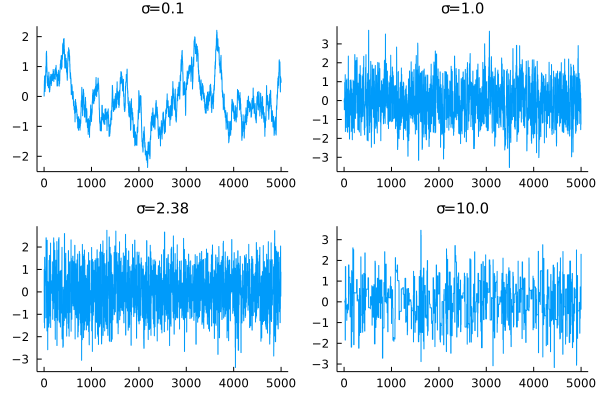

In [6]:
#sample paths
p = plot(layout=(2,2))
for i in range(1,4)
    σ = σ_ls[i]
    plot!(p, X[:, i], layout=(2, 2), subplot=i, title="\\sigma=$σ")
end
p

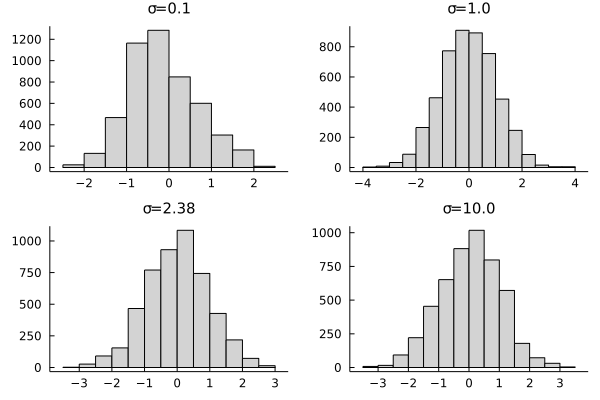

In [7]:
#histograms
p = plot(layout=(2,2))
for i in range(1,4)
    σ = σ_ls[i]
    histogram!(p, X[:, i], layout=(2, 2), subplot=i, 
        title="\\sigma=$σ", bins=15)
end
p

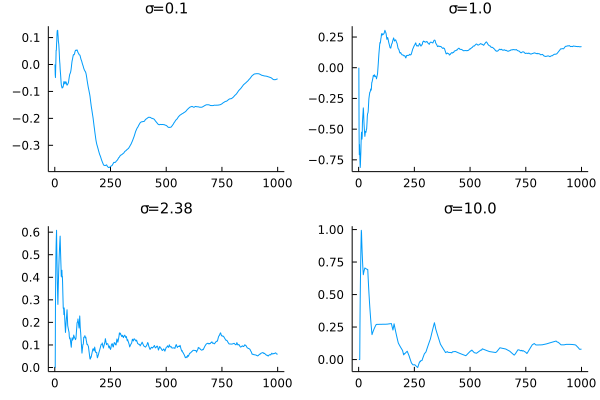

In [11]:
# cumulative averages
#histograms
p = plot(layout=(2,2))
for i in range(1,4)
    σ = σ_ls[i]
    plot!(p, cumsum(X[:, i]) ./ [1:1:n;], layout=(2, 2), subplot=i, 
        title="\\sigma=$σ", bins=15)
end
p

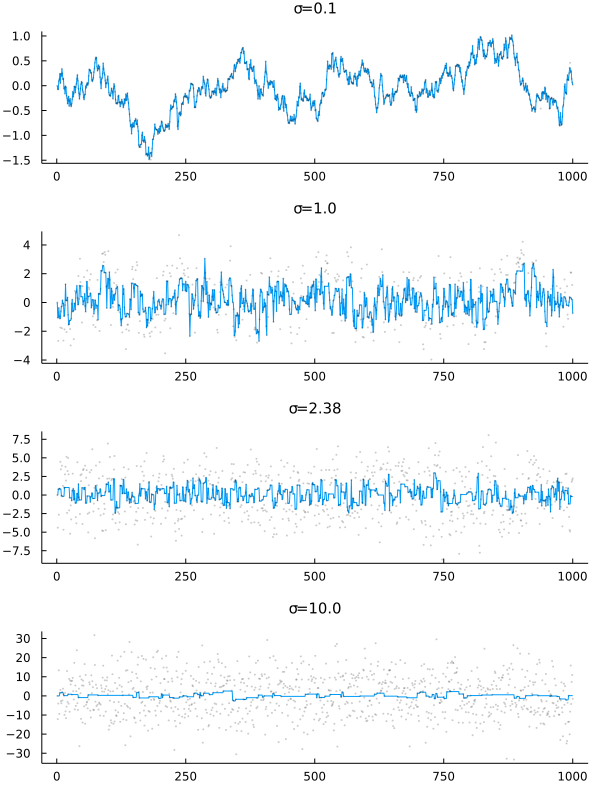

In [10]:
# plot of proposals and accepted samples

function mrw_sample2(;target, proposal, X0, n=1000)
    X = Array{Float64, 1}(undef, n)  # accepted values
    Y = Array{Float64, 1}(undef, n)  # all values
    X[1] = X0
    for t in range(2, n)
        Y[t] = X[t] = X[t - 1] + rand(proposal)
        u = rand(Uniform())
        if u > pdf(target, (X[t])) / pdf(target, (X[t - 1]))
            X[t] = X[t-1]
        end
    end
    X, Y
end

n = 1000
σ_ls = [0.1, 1, 2.38, 10]
df = Normal()
X = Array{Float64, 2}(undef, n, 4)
Y = Array{Float64, 2}(undef, n, 4)

for i in range(1, 4)
    g = Normal(0, σ_ls[i])
    X[:, i], Y[:, i] = mrw_sample2(target=df, proposal=g, X0=0, n=n)
end

p = plot(layout=(4, 1), size = (600, 800))
for i in range(1,4)
    σ = σ_ls[i]
    plot!(p, X[:, i], layout=(4, 1), subplot=i, 
        title="\\sigma=$σ")
    scatter!(p, Y[:, i], layout=(4, 1), subplot=i, 
        title="\\sigma=$σ", markeralpha = 0.2)
end
p

### Bayesian probit model


We use a Bayesian porbit model to study the infections resulting from birth by Cesarean section[1]. We have the following variables in our data set:
- $z_{i1}$ - an indicator whether the Cesarian was planned or not
- $z_{i2}$ - an indicator of whether additional risk factors were present at the time of birth 
- $z_{i3}$ -  an indicator of whether antibiotics were given as a prophylaxis
- $n_i$ - total number of patients with a given combination of risk factors
- $Y_i$ - the respone: number of infections that were observed amongst the $n_i$ patients

In [14]:
using CSV, CategoricalArrays

# data import
data = CSV.read("data/caesar.csv", DataFrame, drop=[1])
data[!, "planned"] = recode(categorical(data[!, "noplan"]), "not"=>0, "planned"=>1)
data[!, "risk factors"] = recode(categorical(data[!, "factor"]), "risk factors"=>1, "without"=>0)
data[!, "antibiotics"] = recode(categorical(data[!, "antib"]), "antibiotics"=>1, "without"=>0)
data[!, "total"] = data[!, "w"]
data = data[!, ["y", "total", "planned", "risk factors", "antibiotics"]]
first(data, 5)

,y,total,planned,risk factors,antibiotics
,Int64,Int64,Cat…,Cat…,Cat…
1,3,87,0,1,1
2,1,4,0,1,1
3,2,7,0,1,1
4,2,13,0,1,0
5,1,10,0,1,0


Data can be modelled by assuming that:
$$Y_i \sim Bin(n_i, \pi_i) \quad \pi = \Phi(\mathbf{z}_i^T\mathbf{\beta})$$
Where $\mathbf{z}_i = (1, z_{i1}, z_{i2}, z_{i3})$ and $\Phi(\cdot)$ being the CDF of $N(0,1)$ dsitribution.

Prior:
$$\mathbf{\beta} \sim N\left(\mathbf{0}, \frac{1}{\lambda}I\right)$$

Posterior:
$$f(\mathbf{\beta}| y_1, \ldots, y_n) \propto \left(\prod_{i=1}^{n}\Phi(\mathbf{z}_i^T\mathbf{\beta})^{y_i} 
\dot (1 - \Phi(\mathbf{z}_i^T\mathbf{\beta}))^{n_i - y_i}\right)
\cdot \exp{\left(-\frac{\lambda}{2}\sum_{j=0}^{3}\beta_j^2\right)}$$

In [15]:
function beta_post(β, Y, W, Z, λ)
    log_post = sum(Y .* log.(cdf.(Normal(), Z * β)) 
    + (W .- Y) .* log.(1 .- cdf.(Normal(), Z * β)))
    - (λ / 2) * dot(β, β)
    post = exp(log_post)
    post
end

function mrw_data_sample(;Y, W, Z, λ, σ, n=50000)
    prior_β = MvNormal(zeros(4), 1/λ * I)
    proposal = MvNormal(zeros(4), σ * I)
    B = Array{Float64, 2}(undef, n, 4)
    B[1,:] = rand(prior_β)
    for t in range(2, n)
        B[t,:] = B[t - 1,:] .+ rand(proposal)
        u = rand(Uniform())
        if u > beta_post(B[t,:], Y, W, Z, λ) / beta_post(B[t - 1,:], Y, W, Z, λ) 
            B[t,:] = B[t - 1,:]
        end
    end
    B
end

mrw_data_sample (generic function with 1 method)

In [16]:
Y = data[!, "y"]
W = data[!, "total"]
Z = convert(Matrix{Int64}, 
    Matrix(data[!, ["planned", "risk factors", "antibiotics"]]))
Z = hcat(fill(1, length(Y)), Z)
λ = 1
σ = 0.08

β = mrw_data_sample(Y=Y, W=W, Z=Z, λ=λ, σ=σ);

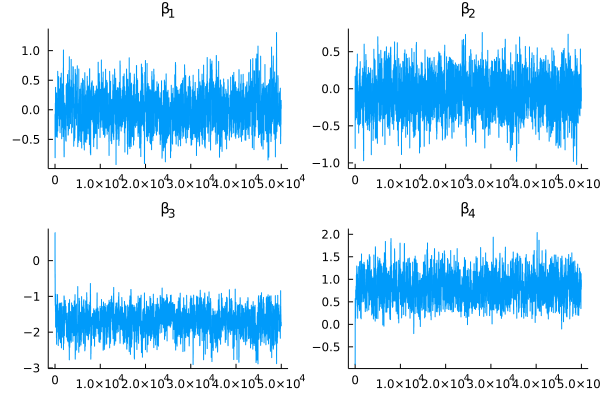

In [17]:
# sample paths
p = plot(layout=(2,2))
for i in range(1,4)
    plot!(p, β[:, i], layout=(2, 2), subplot=i, title="\\beta_{$i}")
end
p

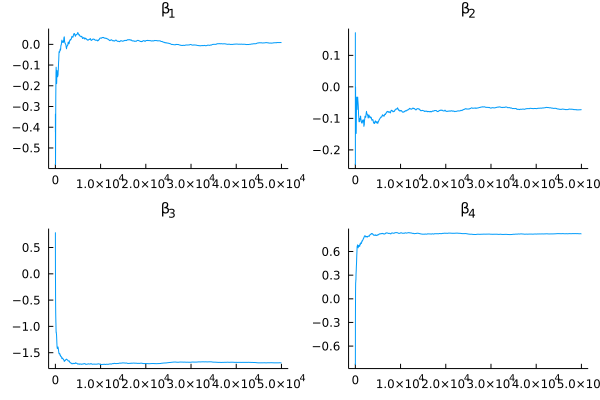

In [18]:
# cumulative averages
p = plot(layout=(2,2))
for i in range(1,4)
    plot!(p, cumsum(β[:, i]) ./ [1:1:size(β)[1];], layout=(2, 2), 
        subplot=i, title="\\beta_{$i}")
end
p

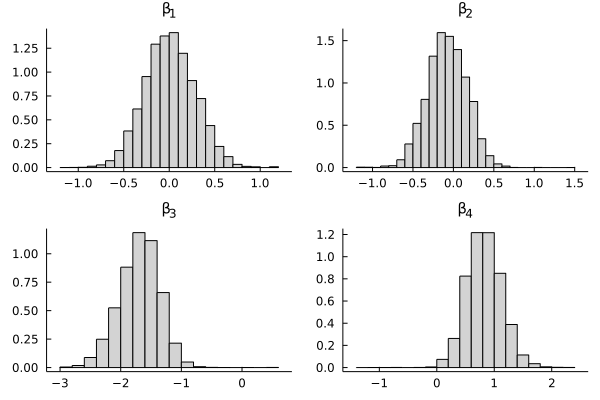

In [22]:
# histograms
p = plot(layout=(2,2))
for i in range(1,4)
    histogram!(p, β[:, i], layout=(2, 2), subplot=i, bins=30, 
        normed=true, title="\\beta_{$i}")
end
p

In [19]:
# Autocorrelations
autocor(β, [1])

1×4 Matrix{Float64}:
 0.963991  0.949997  0.969092  0.959146

---
Bibliography:
1. ST407 Monte Carlo Methods - Lecture notes by Adam M. Johansen (University of Warwick)
2. Metropolis Hastings algorithm - [wikipedia](https://en.wikipedia.org/wiki/Metropolis–Hastings_algorithm) article

References:
1. Fahrmeir, L. and Tutz, G. (2001) Multivariate Statistical Modelling Based on Generalised Linear Models. New York: Springer, 2 edn.